# Applying the trigger logic to all districts


In [84]:
%load_ext jupyter_black
%load_ext autoreload
%autoreload 2

The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [85]:
# Data and visualization
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter, MaxNLocator
from pathlib import Path
from matplotlib.patches import Rectangle
import calendar

import os
import re
import rasterio
import geopandas as gpd
import rasterstats as rs
from fuzzywuzzy import process
from unidecode import unidecode
from scipy.stats.mstats import winsorize
from src.constants import *
from src.utils import *

# Display settings
pd.set_option("display.max_columns", None)
pd.options.display.float_format = "{:,.1f}".format
sns.set(style="whitegrid")

In [86]:
# load admin boundaries
adm2_path = (
    Path(AA_DATA_DIR)
    / "public"
    / "raw"
    / "moz"
    / "cod_ab"
    / "moz_admbnda_adm2_ine_20190607.shp"
)
gdf_adm2 = gpd.read_file(adm2_path)

In [87]:
district_df = pd.read_csv(
    Path(os.getenv("AA_DATA_DIR"))
    / "private"
    / "processed"
    / "moz"
    / "cholera"
    / "cholera_data_all_cleaned.csv"
)
# only keep those with week values
district_df = district_df[district_df["week"].notna()]

In [88]:
# maputo city values are divided into different admin units which are not admin 3
# we should start by summing all values for maputo city
summed = (
    district_df[district_df["province"] == "Maputo Cidade"]
    .groupby(["year", "week"], as_index=False)
    .sum(numeric_only=True)
)
summed["province"] = "Maputo Cidade"
summed["district"] = "Maputo Cidade"
summed
df_rest = district_df[district_df["province"] != "Maputo Cidade"]
district_df = pd.concat([df_rest, summed], ignore_index=True)
district_df

,province,district,year,week,cases
0,Cabo Delgado,Ancuabe,2017,1.0,104.0
1,Cabo Delgado,Ancuabe,2017,2.0,103.0
2,Cabo Delgado,Ancuabe,2017,3.0,81.0
3,Cabo Delgado,Ancuabe,2017,4.0,94.0
4,Cabo Delgado,Ancuabe,2017,5.0,84.0
...,...,...,...,...,...
60895,Maputo Cidade,Maputo Cidade,2025,19.0,928.0
60896,Maputo Cidade,Maputo Cidade,2025,20.0,"1,066.0"
60897,Maputo Cidade,Maputo Cidade,2025,21.0,"1,082.0"
60898,Maputo Cidade,Maputo Cidade,2025,22.0,"1,200.0"


In [89]:
# testing out winsorization
winsorized_values = district_df.groupby(["province", "district"])[
    "cases"
].transform(
    lambda x: winsorize(
        x, limits=[winsorising_lower_limit, winsorising_upper_limit]
    )
)
district_df["cases_winsorized"] = winsorized_values

In [90]:
# using the 2025 file
gdf_adm2_pop = pd.read_csv(
    Path(AA_DATA_DIR)
    / "public"
    / "processed"
    / "moz"
    / "worldpop"
    / "adm2_population_totals.csv"
)
gdf_adm2 = gdf_adm2.merge(
    gdf_adm2_pop,
    how="left",
    on="ADM2_PCODE",
    suffixes=("", "_pop"),
)

In [91]:
# it seems the admin bounds districts are not matching the cholera data ones
# trying some fuzzy matching to see if we can get a match


# add the population data to the gdf
pop_df = gdf_adm2[["ADM2_PT", "ADM1_PT", "sum_population"]].copy()
district_df.loc[:, "district_norm"] = district_df["district"].apply(normalize)
pop_df["ADM2_PT_norm"] = pop_df["ADM2_PT"].apply(normalize)
mapping = {}
for name in district_df["district_norm"]:
    result = process.extractOne(name, pop_df["ADM2_PT_norm"])
    if result:
        match, score = result[0], result[1]
    if score >= 80:
        match_row = pop_df[pop_df["ADM2_PT_norm"] == match].iloc[0]
        mapping[name] = match_row["ADM2_PT"]
district_df["matched_name"] = district_df["district_norm"].map(mapping)

In [92]:
# cidade de maputo is split into various smaller units
# inhassunge is labelled as inhass
# lago niassa is different from lago
manual_map = {
    "inhass": "Inhassunge",
}
for name in district_df["district_norm"]:
    if "maputo" in name and "city" in name:
        manual_map[name] = "Cidade de Maputo"
mapping.update(manual_map)
district_df["matched_name"] = district_df["district_norm"].map(mapping)

In [93]:
district_df["date"] = pd.to_datetime(
    district_df["year"].astype(str)
    + district_df["week"].astype(int).astype(str).str.zfill(2)
    + "1",
    format="%G%V%u",
)

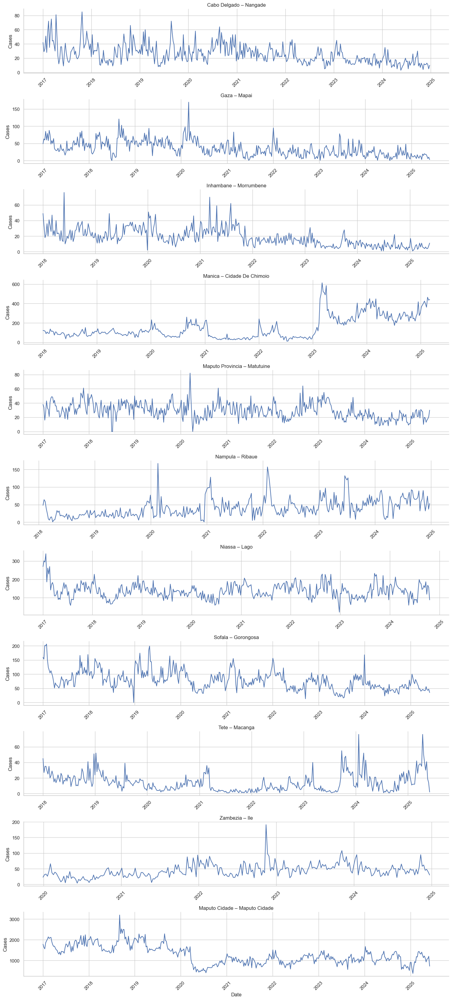

In [94]:
# Plot a random sample of one district per province
# to avoid too many plots, we will sample one district per province
selected_districts = (
    district_df.groupby("province")["district"]
    .apply(lambda x: x.sample(n=1, random_state=42).iloc[0])
    .tolist()
)
filtered_df = district_df[district_df["district"].isin(selected_districts)]
district_labels = filtered_df.groupby("province")["district"].first().to_dict()
g = sns.FacetGrid(
    filtered_df,
    row="province",
    sharex=False,
    sharey=False,
    height=3,
    aspect=5,
)
g.map_dataframe(sns.lineplot, x="date", y="cases_winsorized")

for ax in g.axes.flat:
    province = ax.get_title().replace("province = ", "")
    district = district_labels.get(province, "")
    ax.set_title(f"{province} – {district}")

g.set_axis_labels("Date", "Cases")
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)
plt.tight_layout()
plt.show()

In [95]:
# Normalise the cholera data by population
district_pop_df = district_df.merge(
    pop_df, left_on="matched_name", right_on="ADM2_PT", how="left"
)

In [96]:
pop_df[pop_df["ADM2_PT"] == "Cidade De Maputo"]

,ADM2_PT,ADM1_PT,sum_population,ADM2_PT_norm
30,Cidade De Maputo,Maputo City,"1,018,559.4",cidade de maputo


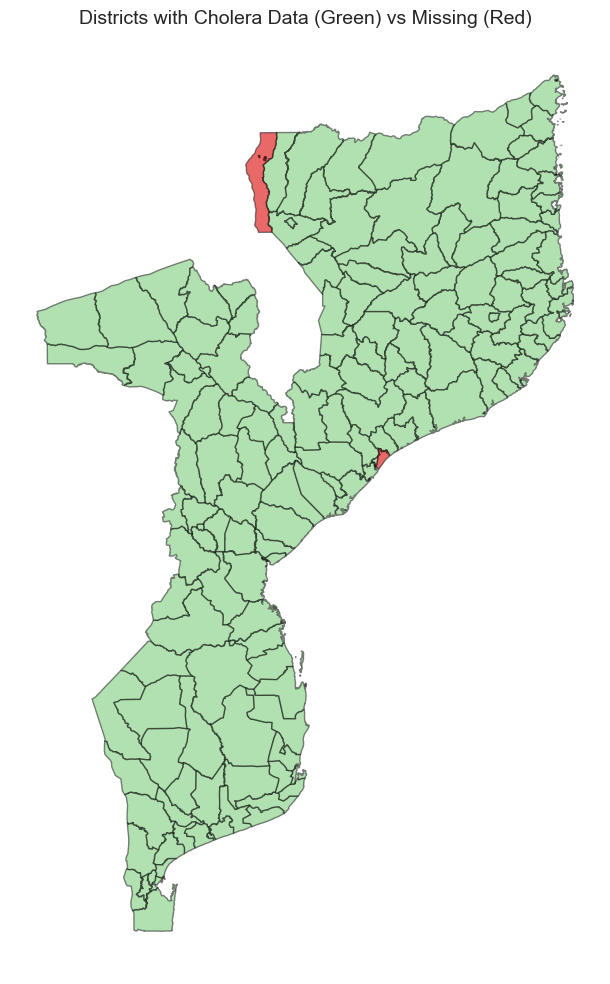

In [97]:
base = gdf_adm2.plot(color="lightgrey", edgecolor="white", figsize=(10, 10))

matched_districts = district_pop_df["ADM2_PT"].unique()
gdf_matched = gdf_adm2[gdf_adm2["ADM2_PT"].isin(matched_districts)]
gdf_matched.plot(ax=base, color="lightgreen", edgecolor="black", alpha=0.5)

gdf_missing = gdf_adm2[~gdf_adm2["ADM2_PT"].isin(matched_districts)]
gdf_missing.plot(ax=base, color="red", edgecolor="black", alpha=0.5)

plt.title("Districts with Cholera Data (Green) vs Missing (Red)", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

In [98]:
# not all districts are in the cholera data
gdf_missing[["ADM2_PT", "ADM1_PT"]]

,ADM2_PT,ADM1_PT
53,Ilha Licom,Niassa
54,Ilha Risunodo,Niassa
60,Lago Niassa,Niassa
85,Maquival,Zambezia


In [99]:
# check if merging is done well
# it should be empty if all the names are matched
district_pop_df[district_pop_df["ADM2_PT"].isna()][
    [
        "province",
        "district",
        "matched_name",
    ]
].drop_duplicates()

,province,district,matched_name


In [100]:
# No district called Sofala

In [101]:
gdf_adm2[gdf_adm2["ADM1_PT"].isin(["Maputo City"])]

,Shape_Leng,Shape_Area,ADM2_PT,ADM2_PCODE,ADM2_REF,ADM2ALT1PT,ADM2ALT2PT,ADM1_PT,ADM1_PCODE,ADM0_EN,ADM0_PT,ADM0_PCODE,date,validOn,validTo,geometry,ADM1_PT_pop,ADM2_PT_pop,sum_population
30,1.8,0.0,Cidade De Maputo,MZ0601,None,None,None,Maputo City,MZ06,Mozambique,Moçambique,MZ,2019-04-02,2019-06-07,0000/00/00,"MULTIPOLYGON (((32.99494 -25.97092, 32.99488 -...",Maputo City,Cidade De Maputo,"1,018,559.4"


In [102]:
# now, normalise the cholera data by population
district_pop_df["cases_per_100k"] = (
    district_pop_df["cases_winsorized"] / district_pop_df["sum_population"]
) * 100000
district_pop_df["cases_per_100k"].describe()

count   57,800.0
mean        40.0
std         44.3
min          0.0
25%         10.8
50%         26.5
75%         54.2
max        892.1
Name: cases_per_100k, dtype: float64

In [103]:
# check the distribution of the cases per 100k
# look at 99th percentile to set a trigger for each province OR 4x weekly increase in cases
# Calculate percentiles per province
percentiles = (
    district_pop_df[district_pop_df["cases_per_100k"] > 0]
    .groupby("province")["cases_per_100k"]
    .quantile([0.99])
    .unstack()
)

# Merge percentiles back into the main df
district_df_with_percentiles = district_pop_df.merge(
    percentiles.rename(columns={0.99: "p99"}),
    left_on="province",
    right_index=True,
    how="left",
)
district_df_with_percentiles["weekly_pct_increase"] = (
    district_df_with_percentiles
    # group by district and calculate percentage change
    .groupby("district")["cases_per_100k"].pct_change(fill_method=None)
    * 100
)

In [104]:
# Check if cases cross the thresholds
district_df_with_percentiles["above_99th"] = (
    district_df_with_percentiles["cases_per_100k"]
    > district_df_with_percentiles["p99"]
)
district_df_with_percentiles["above_4x"] = (
    district_df_with_percentiles["weekly_pct_increase"] >= 300
)
district_df_with_percentiles["threshold_crossed"] = (
    district_df_with_percentiles["above_99th"]
    | district_df_with_percentiles["above_4x"]
)
district_df_with_percentiles = district_df_with_percentiles.sort_values(
    ["district", "year", "week"]
)
# also adding the condition of at least x cases for 3 consecutive weeks for a province
province_df = (
    district_df_with_percentiles.groupby(["province", "year", "week"])[
        "cases"
    ].sum()
).reset_index()
province_df["adm1_above_limit"] = province_df["cases"] >= province_case_limit
province_df = province_df.sort_values(["province", "year", "week"])
province_df["adm1_threshold_crossed"] = (
    province_df["adm1_above_limit"]
    & province_df.groupby("province")["adm1_above_limit"].shift(1)
    & province_df.groupby("province")["adm1_above_limit"].shift(2)
)
province_df[province_df["adm1_threshold_crossed"]]

,province,year,week,cases,adm1_above_limit,adm1_threshold_crossed
55,Cabo Delgado,2018,3.0,"2,323.0",True,True
56,Cabo Delgado,2018,4.0,"2,298.0",True,True
1821,Maputo Cidade,2018,38.0,"2,522.0",True,True
1822,Maputo Cidade,2018,39.0,"2,311.0",True,True
1823,Maputo Cidade,2018,40.0,"2,497.0",True,True
1824,Maputo Cidade,2018,41.0,"2,491.0",True,True
1846,Maputo Cidade,2019,11.0,"2,100.0",True,True
2772,Nampula,2021,7.0,"2,270.0",True,True
2824,Nampula,2022,7.0,"2,247.0",True,True
2976,Niassa,2017,3.0,"2,448.0",True,True


In [105]:
district_df_with_percentiles = district_df_with_percentiles.merge(
    province_df[
        [
            "province",
            "year",
            "week",
            "adm1_above_limit",
            "adm1_threshold_crossed",
        ]
    ],
    on=["province", "year", "week"],
    how="left",
)
district_df_with_percentiles[
    (district_df_with_percentiles["adm1_threshold_crossed"])
    & (district_df_with_percentiles["province"] == "Sofala")
]

,province,district,year,week,cases,cases_winsorized,district_norm,matched_name,date,ADM2_PT,ADM1_PT,sum_population,ADM2_PT_norm,cases_per_100k,p99,weekly_pct_increase,above_99th,above_4x,threshold_crossed,adm1_above_limit,adm1_threshold_crossed
2395,Sofala,Beira,2019,14.0,"1,097.0","1,097.0",beira,Cidade Da Beira,2019-04-01,Cidade Da Beira,Sofala,"784,405.4",cidade da beira,139.9,150.1,-42.7,False,False,False,True,True
2396,Sofala,Beira,2019,15.0,979.0,979.0,beira,Cidade Da Beira,2019-04-08,Cidade Da Beira,Sofala,"784,405.4",cidade da beira,124.8,150.1,-10.8,False,False,False,True,True
2397,Sofala,Beira,2019,16.0,975.0,975.0,beira,Cidade Da Beira,2019-04-15,Cidade Da Beira,Sofala,"784,405.4",cidade da beira,124.3,150.1,-0.4,False,False,False,True,True
2398,Sofala,Beira,2019,17.0,"1,144.0","1,144.0",beira,Cidade Da Beira,2019-04-22,Cidade Da Beira,Sofala,"784,405.4",cidade da beira,145.8,150.1,17.3,False,False,False,True,True
2399,Sofala,Beira,2019,18.0,848.0,848.0,beira,Cidade Da Beira,2019-04-29,Cidade Da Beira,Sofala,"784,405.4",cidade da beira,108.1,150.1,-25.9,False,False,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54341,Sofala,Nhamatanda,2021,6.0,335.0,335.0,nhamatanda,Nhamatanda,2021-02-08,Nhamatanda,Sofala,"352,903.5",nhamatanda,94.9,150.1,-2.6,False,False,False,True,True
54450,Sofala,Nhamatanda,2023,11.0,180.0,180.0,nhamatanda,Nhamatanda,2023-03-13,Nhamatanda,Sofala,"352,903.5",nhamatanda,51.0,150.1,-18.2,False,False,False,True,True
54451,Sofala,Nhamatanda,2023,12.0,192.0,192.0,nhamatanda,Nhamatanda,2023-03-20,Nhamatanda,Sofala,"352,903.5",nhamatanda,54.4,150.1,6.7,False,False,False,True,True
54452,Sofala,Nhamatanda,2023,13.0,230.0,230.0,nhamatanda,Nhamatanda,2023-03-27,Nhamatanda,Sofala,"352,903.5",nhamatanda,65.2,150.1,19.8,False,False,False,True,True


In [106]:
# Create the new column: True only if this week and the previous two weeks are above the 99th percentile or 4x increase
district_df_with_percentiles["three_consec_crossing"] = (
    district_df_with_percentiles["threshold_crossed"]
    & district_df_with_percentiles.groupby("district")[
        "threshold_crossed"
    ].shift(1)
    & district_df_with_percentiles.groupby("district")[
        "threshold_crossed"
    ].shift(2)
    & (
        (
            (district_df_with_percentiles["district"].isin(capital_districts))
            & (district_df_with_percentiles["cases"] >= capitals_threshold)
            & (
                district_df_with_percentiles["cases"].shift(1)
                >= capitals_threshold
            )
            & (
                district_df_with_percentiles["cases"].shift(2)
                >= capitals_threshold
            )
        )
        | (
            (~district_df_with_percentiles["district"].isin(capital_districts))
            & (district_df_with_percentiles["cases"] >= default_threshold)
            & (
                district_df_with_percentiles["cases"].shift(1)
                >= default_threshold
            )
            & (
                district_df_with_percentiles["cases"].shift(2)
                >= default_threshold
            )
        )
    )
) | district_df_with_percentiles["adm1_threshold_crossed"]
district_df_with_percentiles[
    district_df_with_percentiles["three_consec_crossing"]
][["province", "district"]].drop_duplicates()

,province,district
111,Zambezia,A. Molocue
309,Cabo Delgado,Ancuabe
833,Nampula,Angoche
1088,Tete,Angonia
1502,Cabo Delgado,Balama
...,...,...
57034,Nampula,Rapale
57398,Nampula,Ribaue
57602,Niassa,Sanga
58873,Tete,Tsangano


In [107]:
district_df_with_percentiles[
    district_df_with_percentiles["three_consec_crossing"]
].head(5)

,province,district,year,week,cases,cases_winsorized,district_norm,matched_name,date,ADM2_PT,ADM1_PT,sum_population,ADM2_PT_norm,cases_per_100k,p99,weekly_pct_increase,above_99th,above_4x,threshold_crossed,adm1_above_limit,adm1_threshold_crossed,three_consec_crossing
111,Zambezia,A. Molocue,2022,8.0,97.0,97.0,a. molocue,Alto Molocue,2022-02-21,Alto Molocue,Zambezia,"438,168.6",alto molocue,22.1,135.9,-41.2,False,False,False,True,True,True
309,Cabo Delgado,Ancuabe,2018,3.0,132.0,132.0,ancuabe,Ancuabe,2018-01-15,Ancuabe,Cabo Delgado,"227,434.2",ancuabe,58.0,301.2,28.2,False,False,False,True,True,True
310,Cabo Delgado,Ancuabe,2018,4.0,89.0,89.0,ancuabe,Ancuabe,2018-01-22,Ancuabe,Cabo Delgado,"227,434.2",ancuabe,39.1,301.2,-32.6,False,False,False,True,True,True
833,Nampula,Angoche,2021,7.0,86.0,86.0,angoche,Angoche,2021-02-15,Angoche,Nampula,"434,710.5",angoche,19.8,87.7,22.9,False,False,False,True,True,True
885,Nampula,Angoche,2022,7.0,49.0,49.0,angoche,Angoche,2022-02-14,Angoche,Nampula,"434,710.5",angoche,11.3,87.7,-31.9,False,False,False,True,True,True


In [108]:
# Compute total cases and total cases relative to population per district per year
grouped = (
    district_df_with_percentiles.groupby(["province", "district", "year"])
    .agg(
        average_cases=("cases", "mean"),
        average_cases_per_100k=("cases_per_100k", "mean"),
    )
    .reset_index()
)
grouped

,province,district,year,average_cases,average_cases_per_100k
0,Cabo Delgado,Ancuabe,2017,62.8,27.6
1,Cabo Delgado,Ancuabe,2018,69.1,30.4
2,Cabo Delgado,Ancuabe,2019,56.2,24.7
3,Cabo Delgado,Ancuabe,2020,48.5,21.3
4,Cabo Delgado,Ancuabe,2021,52.9,23.3
...,...,...,...,...,...
1183,Zambezia,Quelim,2020,402.7,74.3
1184,Zambezia,Quelim,2021,399.8,73.8
1185,Zambezia,Quelim,2022,372.2,68.6
1186,Zambezia,Quelim,2023,360.4,66.5


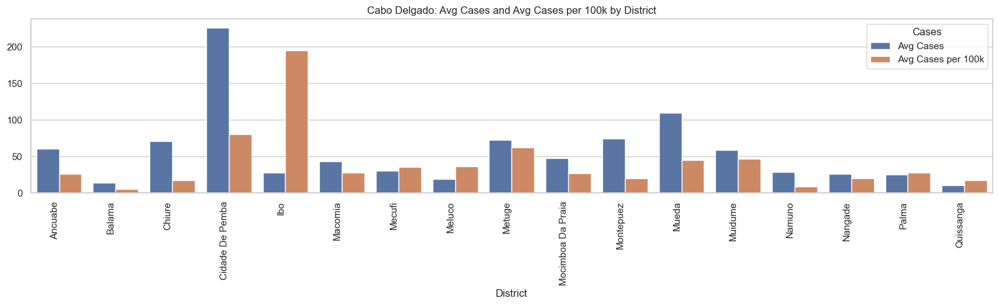

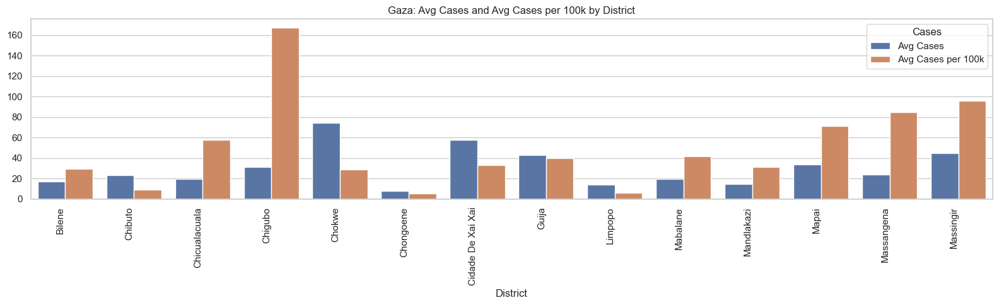

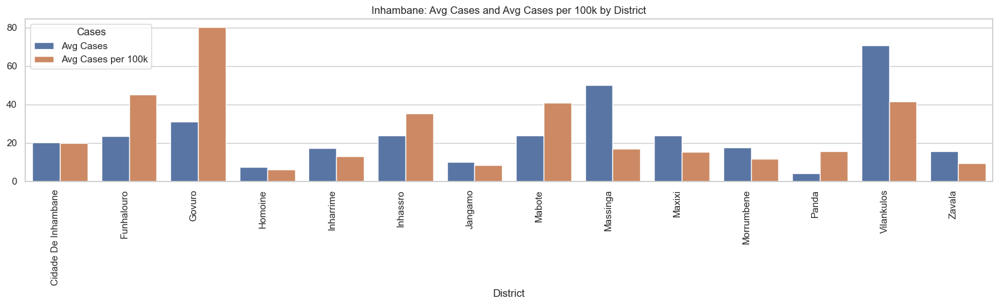

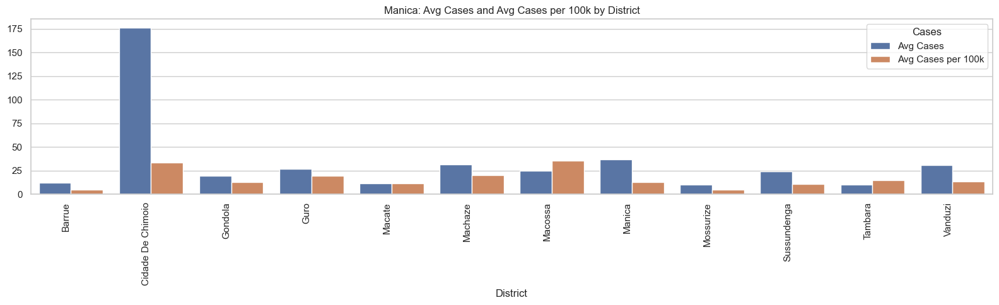

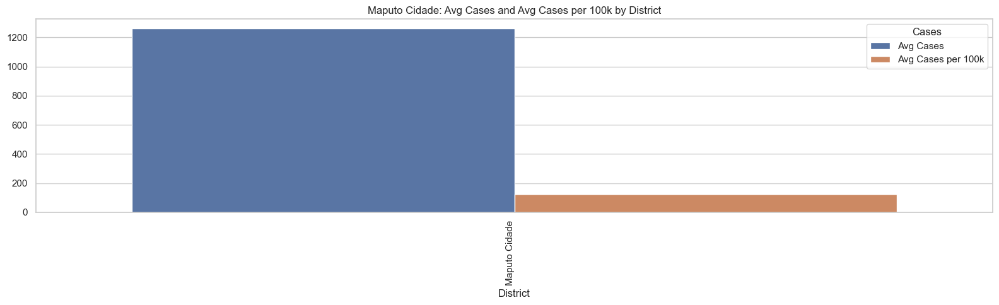

...

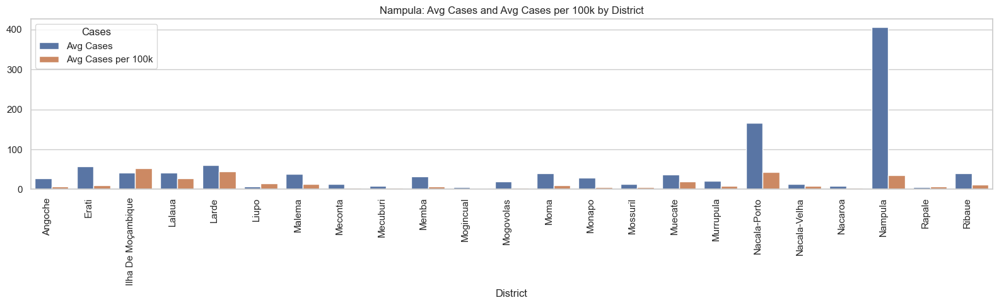

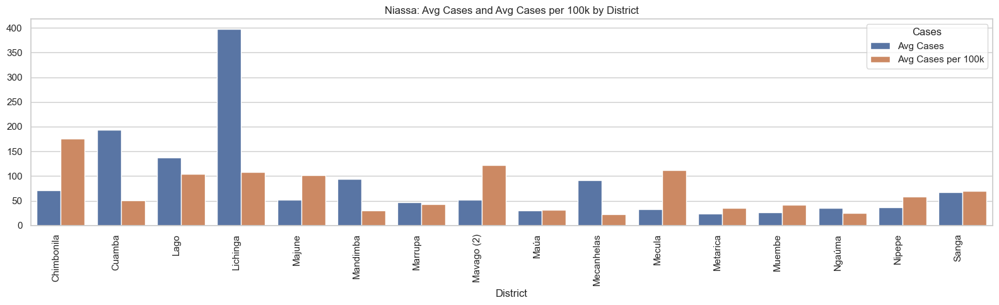

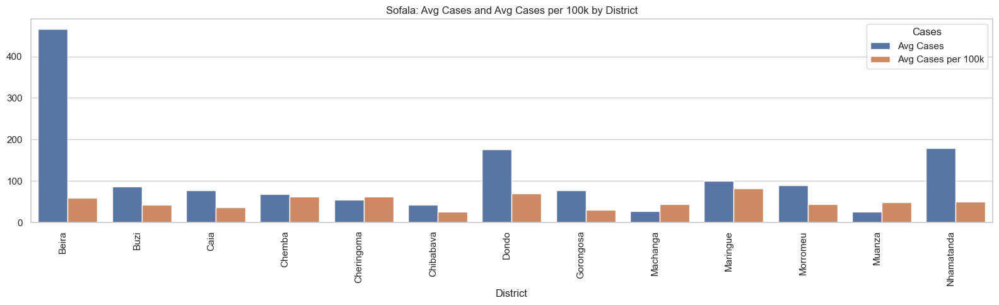

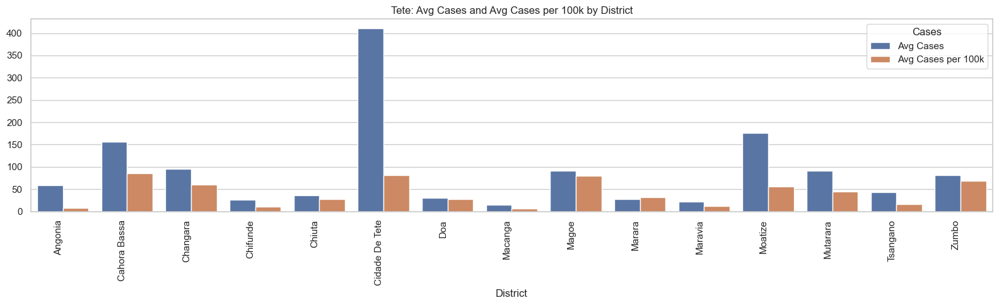

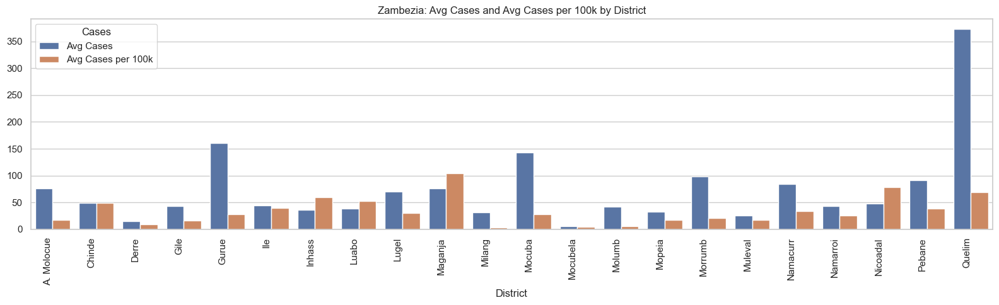

In [109]:
melted = grouped.melt(
    id_vars=["province", "district"],
    value_vars=["average_cases", "average_cases_per_100k"],
    var_name="metric",
    value_name="value",
)

# Rename for cleaner labels
melted["cases"] = melted["metric"].replace(
    {
        "average_cases": "Avg Cases",
        "average_cases_per_100k": "Avg Cases per 100k",
    }
)

# Plot
provinces = melted["province"].unique()

for province in provinces:
    df_prov = melted[melted["province"] == province]

    plt.figure(figsize=(16, 5))
    sns.barplot(
        data=df_prov,
        x="district",
        y="value",
        hue="cases",
        dodge=True,
        errorbar=None,
    )
    plt.title(f"{province}: Avg Cases and Avg Cases per 100k by District")
    plt.xlabel("District")
    plt.xticks(rotation=90, ha="right")
    plt.ylabel("")
    plt.legend(title="Cases")
    plt.tight_layout()
    plt.show()

In [110]:
district_df_with_percentiles[
    district_df_with_percentiles["three_consec_crossing"]
][["year", "week"]].drop_duplicates().sort_values(["year", "week"])
# the number of districts by year and by province when the threshold was crossed
all_years = district_df_with_percentiles["year"].unique()
district_df_with_percentiles[
    district_df_with_percentiles["three_consec_crossing"]
].groupby(["province", "year"])["district"].nunique().unstack(
    fill_value=0
).reindex(
    columns=sorted(all_years), fill_value=0
)

year,2017,2018,2019,2020,2021,2022,2023,2024,2025
province,,,,,,,,,
Cabo Delgado,0,17,0,0,0,0,0,0,0
Manica,0,0,0,0,0,0,1,0,1
Maputo Cidade,0,1,1,0,0,0,0,0,0
Maputo Provincia,0,1,1,0,0,0,0,0,0
Nampula,0,0,0,1,23,23,0,0,0
Niassa,16,16,0,0,1,2,16,0,0
Sofala,1,0,13,0,13,1,13,0,0
Tete,0,0,15,0,0,0,15,3,1
Zambezia,0,0,0,1,1,21,1,1,0


In [111]:
# Filter if you want only the crossings
crossed_99th = district_df_with_percentiles[
    district_df_with_percentiles["three_consec_crossing"]
]

district_trigger_99th = (
    crossed_99th.groupby(["province", "district", "year"])["week"]
    .count()
    .reset_index(name="week_count")
)
district_trigger_99th

,province,district,year,week_count
0,Cabo Delgado,Ancuabe,2018,2
1,Cabo Delgado,Balama,2018,2
2,Cabo Delgado,Chiure,2018,2
3,Cabo Delgado,Cidade De Pemba,2018,2
4,Cabo Delgado,Ibo,2018,2
...,...,...,...,...
216,Zambezia,Namarroi,2022,1
217,Zambezia,Nicoadal,2022,1
218,Zambezia,Nicoadal,2023,1
219,Zambezia,Pebane,2022,1


In [112]:
district_df_with_percentiles[
    district_df_with_percentiles["district"].isin(
        district_trigger_99th["district"].unique()
    )
]

,province,district,year,week,cases,cases_winsorized,district_norm,matched_name,date,ADM2_PT,ADM1_PT,sum_population,ADM2_PT_norm,cases_per_100k,p99,weekly_pct_increase,above_99th,above_4x,threshold_crossed,adm1_above_limit,adm1_threshold_crossed,three_consec_crossing
0,Zambezia,A. Molocue,2020,1.0,196.0,196.0,a. molocue,Alto Molocue,2019-12-30,Alto Molocue,Zambezia,"438,168.6",alto molocue,44.7,135.9,NaN,False,False,False,False,False,False
1,Zambezia,A. Molocue,2020,2.0,182.0,182.0,a. molocue,Alto Molocue,2020-01-06,Alto Molocue,Zambezia,"438,168.6",alto molocue,41.5,135.9,-7.1,False,False,False,False,False,False
2,Zambezia,A. Molocue,2020,3.0,132.0,132.0,a. molocue,Alto Molocue,2020-01-13,Alto Molocue,Zambezia,"438,168.6",alto molocue,30.1,135.9,-27.5,False,False,False,False,False,False
3,Zambezia,A. Molocue,2020,4.0,145.0,145.0,a. molocue,Alto Molocue,2020-01-20,Alto Molocue,Zambezia,"438,168.6",alto molocue,33.1,135.9,9.8,False,False,False,False,False,False
4,Zambezia,A. Molocue,2020,5.0,49.0,49.0,a. molocue,Alto Molocue,2020-01-27,Alto Molocue,Zambezia,"438,168.6",alto molocue,11.2,135.9,-66.2,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60895,Tete,Zumbo,2025,48.0,NaN,NaN,zumbo,Zumbu,2025-11-24,Zumbu,Tete,"118,176.1",zumbu,NaN,158.0,NaN,False,False,False,False,False,False
60896,Tete,Zumbo,2025,49.0,NaN,NaN,zumbo,Zumbu,2025-12-01,Zumbu,Tete,"118,176.1",zumbu,NaN,158.0,NaN,False,False,False,False,False,False
60897,Tete,Zumbo,2025,50.0,NaN,NaN,zumbo,Zumbu,2025-12-08,Zumbu,Tete,"118,176.1",zumbu,NaN,158.0,NaN,False,False,False,False,False,False
60898,Tete,Zumbo,2025,51.0,NaN,NaN,zumbo,Zumbu,2025-12-15,Zumbu,Tete,"118,176.1",zumbu,NaN,158.0,NaN,False,False,False,False,False,False


In [113]:
month_num = {
    month: idx for idx, month in enumerate(calendar.month_name) if month
}


def highlight_month_boxes(data, cerf_y_lim="cases_per_100k", **kwargs):
    ax = plt.gca()

    # Add vertical lines
    consec_dates = data.loc[
        data["three_consec_crossing"], "date"
    ].sort_values()

    if not consec_dates.empty:
        # Convert to periods (daily)
        diffs = consec_dates.diff().dt.days.fillna(1)
        group = (diffs != 7).cumsum()  # Use 7 for weekly data

        for _, g in consec_dates.groupby(group):
            start = g.min()
            end = g.max()
            y_min = data.loc[
                (data["date"] >= start) & (data["date"] <= end),
                "cases_per_100k",
            ].min()
            y_max = data.loc[
                (data["date"] >= start) & (data["date"] <= end),
                "cases_per_100k",
            ].max()
            ax.add_patch(
                Rectangle(
                    (start, 0),
                    end - start,
                    ax.get_ylim()[1],
                    facecolor="red",
                    alpha=0.5,
                    edgecolor="red",
                )
            )

    # Highlight selected months
    for year, month in highlight_cells:
        month_index = month_num.get(month)
        if not month_index:
            continue

        mask = (data["date"].dt.year == year) & (
            data["date"].dt.month == month_index
        )
        if not mask.any():
            continue

        month_data = data.loc[mask]
        x_min = month_data["date"].min()
        x_max = month_data["date"].max()
        y_min = max(0, month_data[cerf_y_lim].min() - 5)
        y_max = month_data[cerf_y_lim].max() + 5

        ax.add_patch(
            Rectangle(
                (x_min, y_min),
                x_max - x_min,
                y_max - y_min,
                facecolor="green",
                edgecolor="green",
                alpha=0.5,
                linewidth=1,
            )
        )

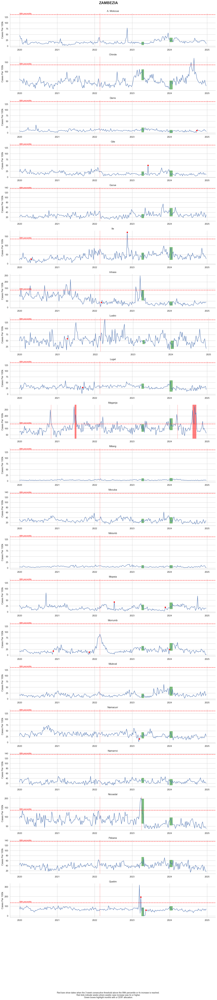

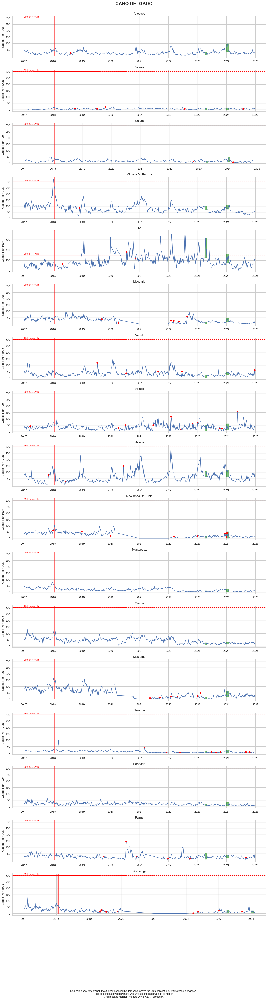

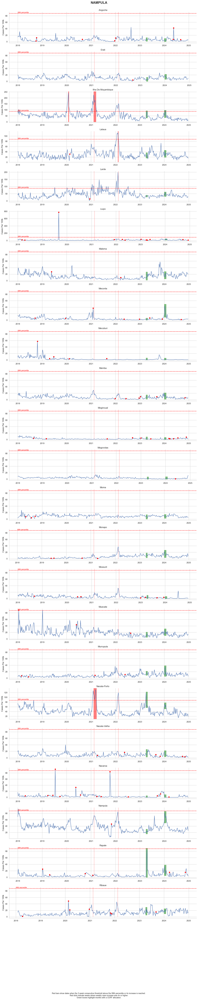

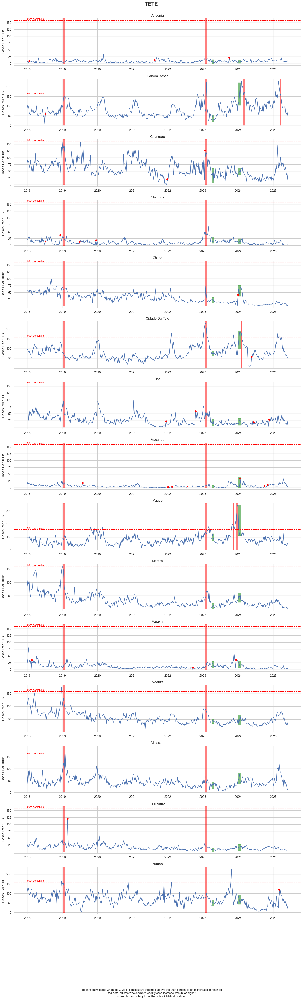

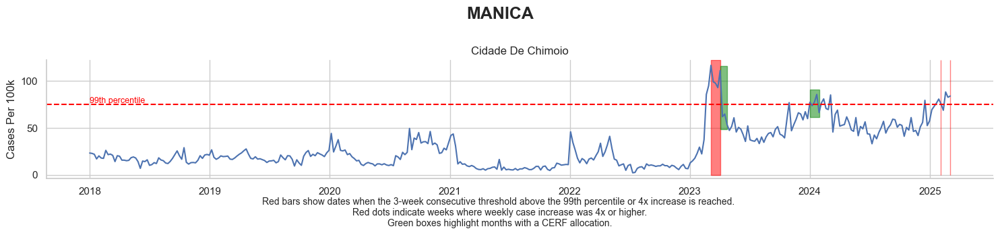

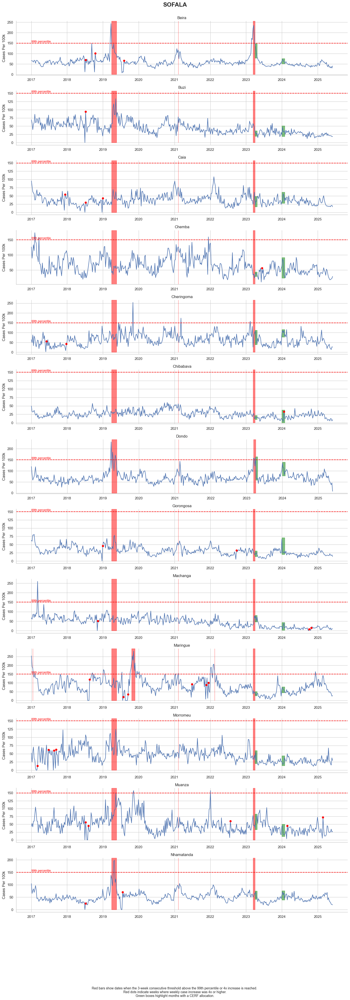

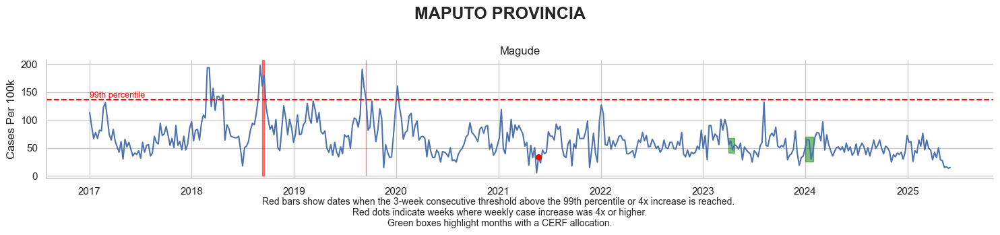

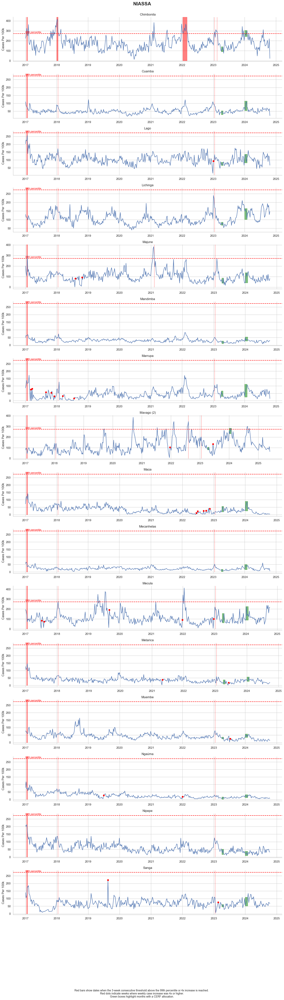

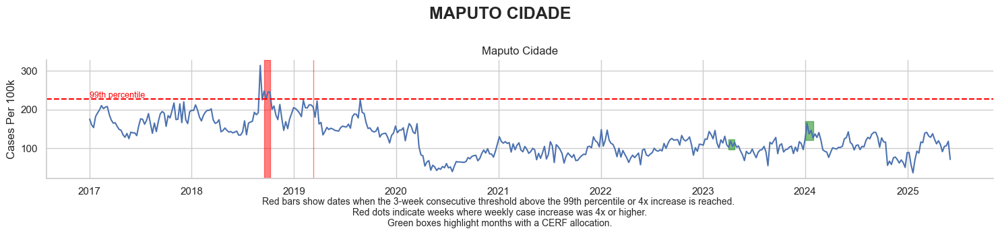

In [114]:
unique_provinces = district_df_with_percentiles["province"].unique()

for province in unique_provinces:
    subset = district_df_with_percentiles[
        (district_df_with_percentiles["province"] == province)
        & (
            district_df_with_percentiles["district"].isin(
                district_trigger_99th["district"].unique()
            )
        )
    ]

    if subset.empty:
        continue

    g = sns.FacetGrid(
        subset,
        col="district",
        col_wrap=1,
        sharex=False,
        sharey=False,
        height=3,
        aspect=5,
    )

    # Plot main line
    g.map_dataframe(sns.lineplot, x="date", y="cases_per_100k")
    # g.map_dataframe(
    #    sns.lineplot,
    #    x="date",
    #    y="cases",
    #    linestyle="--",
    #    color="orange",
    #    label="Actual Cases",
    # )

    # Add horizontal 99th percentile line
    g.map_dataframe(
        lambda data, color, **kws: (
            plt.axhline(y=data["p99"].iloc[0], color="red", linestyle="--"),
            plt.text(
                data["date"].min(),
                data["p99"].iloc[0],
                "99th percentile",
                color="red",
                fontsize=9,
                verticalalignment="bottom",
                horizontalalignment="left",
            ),
        ),
    )
    g.map_dataframe(
        lambda data, **kws: plt.scatter(
            data.loc[data["weekly_pct_increase"] >= 400, "date"],
            data.loc[data["weekly_pct_increase"] >= 400, "cases_per_100k"],
            color="red",
            s=30,
            zorder=5,
        )
    )

    # Add vertical red lines where condition is true
    def add_vertical_lines(data, **kwargs):
        for date in data.loc[data["three_consec_crossing"], "date"]:
            plt.axvline(x=date, color="red", linestyle="-", linewidth=1)

    # g.map_dataframe(add_vertical_lines)
    g.map_dataframe(highlight_month_boxes)
    g.set_titles(f"{{col_name}}")
    g.set_axis_labels("", "Cases Per 100k")

    for ax in g.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(0)
    plt.suptitle(f"{province.upper()}", fontsize=18, weight="bold", y=1)
    plt.tight_layout()
    plt.figtext(
        0.5,
        -0.08,
        "Red bars show dates when the 3-week consecutive threshold above the 99th percentile or 4x increase is reached. \n "
        "Red dots indicate weeks where weekly case increase was 4x or higher. \n"
        "Green boxes highlight months with a CERF allocation.",
        wrap=True,
        horizontalalignment="center",
        fontsize=10,
    )
    plt.show()

In [115]:
# showing summary by province
trigger_df = district_df_with_percentiles[
    district_df_with_percentiles["three_consec_crossing"] == True
].copy()

# Extract month and year
trigger_df["month"] = pd.to_datetime(trigger_df["date"]).dt.month_name()
trigger_df["year"] = pd.to_datetime(trigger_df["date"]).dt.year

# Group by province, year, month
summary = (
    trigger_df.groupby(["ADM1_PT", "year", "month"])
    .agg(
        num_trigger_weeks=("week", "nunique"),
        cases_per_100k=("cases_per_100k", "first"),
        districts=("district", lambda x: ", ".join(sorted(set(x)))),
    )
    .reset_index()
    .rename(columns={"ADM1_PT": "province"})
    .sort_values(["province", "year", "month"])
)
summary["district_count"] = (
    summary["districts"]
    .str.split(",")
    .apply(lambda x: len([d.strip() for d in x if d.strip()]))
)
summary = summary[summary["district_count"] >= number_of_districts]

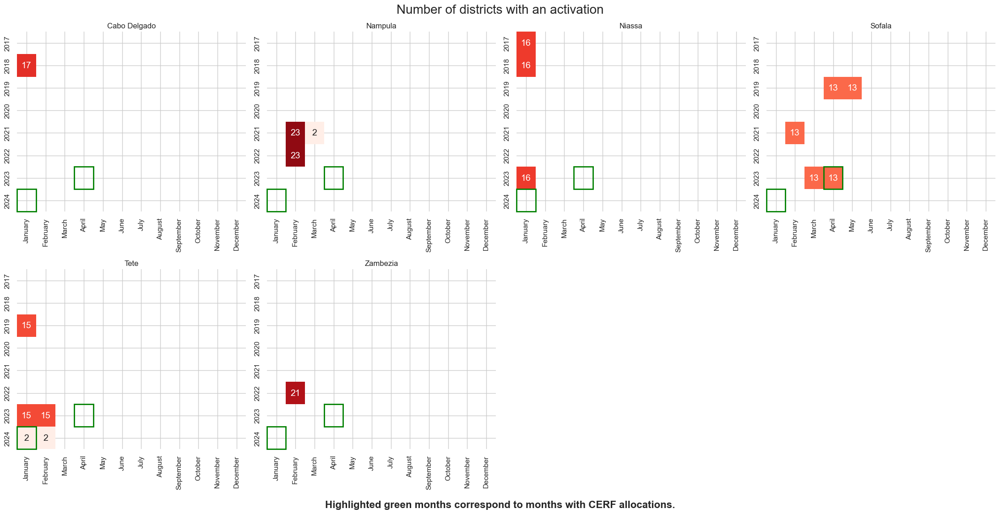

In [116]:
# Pivot the data
pivot_dist = summary.pivot_table(
    values="district_count",
    index="year",
    columns="month",
    aggfunc="mean",
    observed=False,
).sort_index()

all_years = list(range(summary["year"].min(), summary["year"].max() + 1))

# Faceted heatmap
g = sns.FacetGrid(
    summary,
    col="province",
    col_wrap=4,
    height=5.5,
    aspect=1,
    sharex=False,
    sharey=False,
)


def heatmap_with_all_years(data, **kwargs):
    table = data.pivot_table(
        index="year",
        columns="month",
        values="district_count",
        aggfunc="first",
        observed=False,
    ).reindex(index=all_years, columns=month_order)

    sns.heatmap(
        table,
        cmap="Reds",
        cbar=False,
        annot=True,
        fmt=".0f",
        linewidths=0,
        linecolor=None,
        vmin=1,
        vmax=25,
        annot_kws={"size": 14},
    )
    ax = plt.gca()

    # Loop and draw rectangles
    for year, month in highlight_cells:
        try:
            row_idx = table.index.get_loc(year)
            col_idx = table.columns.get_loc(month)
            ax.add_patch(
                plt.Rectangle(
                    (col_idx, row_idx),
                    1,
                    1,
                    fill=False,
                    edgecolor="green",
                    linewidth=2,
                    clip_on=False,
                )
            )
        except KeyError:
            continue


g.map_dataframe(heatmap_with_all_years)
g.set_titles(col_template="{col_name}", fontsize=20)
# ax.tick_params(axis="x", labelsize=18)
# ax.tick_params(axis="y", labelsize=18)
g.set_axis_labels("", "")
g.fig.suptitle(
    "Number of districts with an activation",
    fontsize=20,
)
plt.figtext(
    0.5,
    -0.02,
    "Highlighted green months correspond to months with CERF allocations.",
    ha="center",
    fontsize=16,
    fontweight="bold",
)
plt.tight_layout()
plt.show()

In [117]:
activated = summary[summary["district_count"] > 0]

activated_provinces_monthly = (
    activated[["year", "month", "province"]]
    .drop_duplicates()
    .sort_values(["year", "month", "province"])
)

activated_by_year_month = (
    activated_provinces_monthly.groupby(["year", "month"], observed=False)[
        "province"
    ]
    .apply(list)
    .reset_index()
)

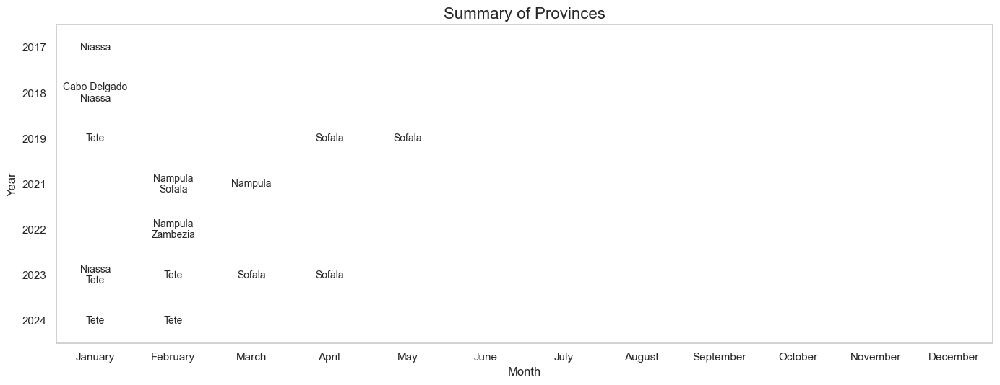

In [118]:
def parse_province_field(x):
    """Turn '[A, B]' -> ['A','B']; keep list if already list-like."""
    if isinstance(x, list):
        return x
    s = str(x).strip()
    if s.startswith("[") and s.endswith("]"):
        s = s[1:-1]
    parts = [p.strip() for p in s.split(",") if p.strip()]
    return parts


df = activated_by_year_month[
    ~activated_by_year_month["province"].isna()
].copy()
df["province_list"] = df["province"].apply(parse_province_field)
df["month"] = pd.Categorical(df["month"], categories=month_order, ordered=True)

years = sorted(df["year"].unique())
events = df.explode("province_list").rename(
    columns={"province_list": "province_clean"}
)
events["province_clean"] = events["province_clean"].astype(str)
cell = {(y, m): [] for y in years for m in month_order}
for _, r in events.iterrows():
    cell[(r["year"], r["month"])].append(r["province_clean"])


def format_cell(provs):
    if not provs:
        return ""
    flat = []
    for p in provs:
        if isinstance(p, (list, tuple, set)):
            flat.extend(str(x).strip() for x in p if str(x).strip())
        else:
            flat.append(str(p).strip())
    uniq = sorted({x for x in flat if x})
    return "\n".join(uniq)


grid_text = [[format_cell(cell[(y, m)]) for m in month_order] for y in years]
data = np.zeros((len(years), len(month_order)))

fig, ax = plt.subplots(figsize=(14, 0.5 * len(years) + 2))
# ax.imshow(data, aspect="auto")
ax.set_facecolor("white")

for i, y in enumerate(years):
    for j, m in enumerate(month_order):
        lbl = grid_text[i][j]
        if lbl:
            ax.text(
                j,
                i,
                lbl,
                ha="center",
                va="center",
                linespacing=1.1,
                fontsize=10,
            )

ax.set_xticks(range(len(month_order)))
ax.set_xticklabels(month_order, rotation=0)
ax.set_yticks(range(len(years)))
ax.set_yticklabels(years)
ax.set_xlim(-0.5, len(month_order) - 0.5)
ax.set_ylim(len(years) - 0.5, -0.5)
ax.grid(False)
ax.set_xlabel("Month")
ax.set_ylabel("Year")
ax.set_title("Summary of Provinces", fontsize=16)
plt.tight_layout()
plt.show()

C:\Users\pauni\AppData\Local\Temp\ipykernel_45796\3530490232.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(keep_with_cooldown, months=2)


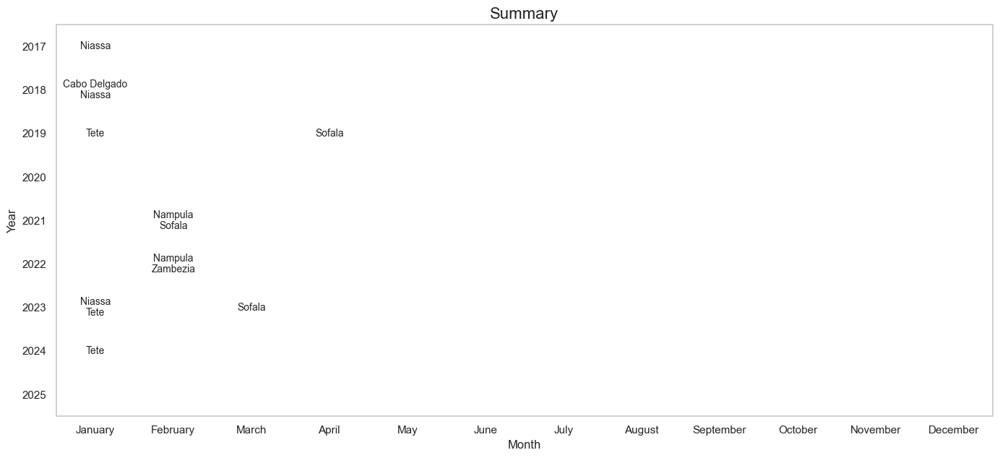

In [121]:
# build a monthly date for cooldown
m2n = {m: i + 1 for i, m in enumerate(month_order)}
events["month_num"] = events["month"].astype(str).map(m2n).astype(int)
events["date"] = pd.to_datetime(
    events["year"].astype(int).astype(str)
    + "-"
    + events["month_num"].astype(int).astype(str).str.zfill(2)
    + "-01"
)


# keep at most one activation per province every 2 months
def keep_with_cooldown(g, months=2):
    g = g.sort_values("date")
    keep = []
    next_ok = pd.Timestamp.min
    for d in g["date"]:
        if d >= next_ok:
            keep.append(True)
            next_ok = d + pd.DateOffset(months=months)
        else:
            keep.append(False)
    return g.loc[keep]


events_cd = (
    events.groupby("province_clean", group_keys=False)
    .apply(keep_with_cooldown, months=2)
    .reset_index(drop=True)
)

# --- rebuild the cell grid from filtered events ---
years = list(range(2017, 2026))  # force 2017–2025
cell = {(y, m): [] for y in years for m in month_order}
for _, r in events_cd.iterrows():
    cell[(int(r["year"]), str(r["month"]))].append(r["province_clean"])


def format_cell(provs):
    if not provs:
        return ""
    flat = []
    for p in provs:
        flat.extend(p if isinstance(p, (list, tuple, set)) else [p])
    return "\n".join(sorted({str(x).strip() for x in flat if str(x).strip()}))


grid_text = [[format_cell(cell[(y, m)]) for m in month_order] for y in years]

# --- plotting stays the same ---
fig, ax = plt.subplots(figsize=(14, 0.5 * len(years) + 2))
ax.set_facecolor("white")
for i, y in enumerate(years):
    for j, m in enumerate(month_order):
        lbl = grid_text[i][j]
        if lbl:
            ax.text(
                j,
                i,
                lbl,
                ha="center",
                va="center",
                linespacing=1.1,
                fontsize=10,
            )

ax.set_xticks(range(len(month_order)))
ax.set_xticklabels(month_order)
ax.set_yticks(range(len(years)))
ax.set_yticklabels(years)
ax.set_xlim(-0.5, len(month_order) - 0.5)
ax.set_ylim(len(years) - 0.5, -0.5)
ax.grid(False)
ax.set_xlabel("Month")
ax.set_ylabel("Year")
ax.set_title("Summary", fontsize=16)
plt.tight_layout()
plt.show()

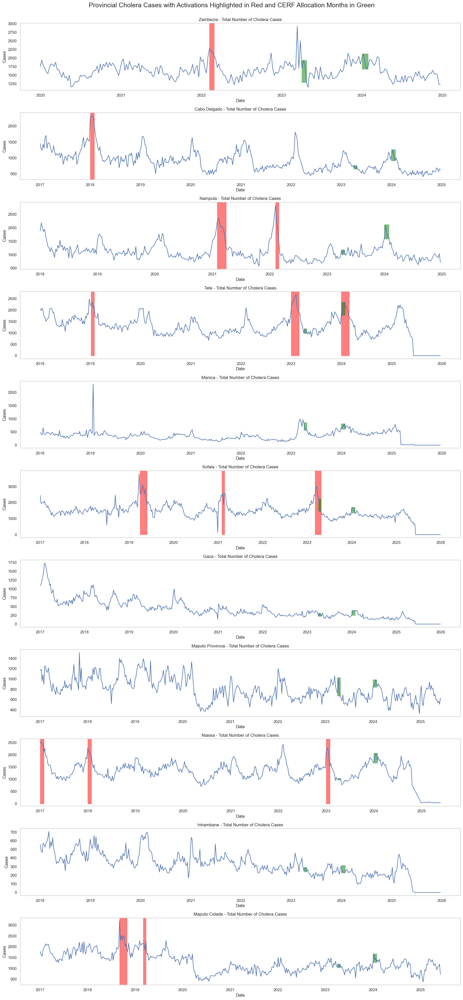

In [125]:
# keep only provinces that have data
provinces = [
    p
    for p in district_df_with_percentiles["province"].dropna().unique()
    if not district_df_with_percentiles.loc[
        district_df_with_percentiles["province"] == p
    ].empty
]
n_prov = len(provinces)

fig, axes = plt.subplots(n_prov, 1, figsize=(18, 3.5 * n_prov), sharex=False)
if n_prov == 1:
    axes = [axes]

for ax, province in zip(axes, provinces):
    # all districts in the province (include all, not just triggered ones)
    province_df = district_df_with_percentiles[
        district_df_with_percentiles["province"] == province
    ]

    # aggregate totals per date
    agg = (
        province_df.groupby("date", as_index=False)
        .agg({"cases": "sum", "cases_per_100k": "sum"})
        .sort_values("date")
    )

    # threshold dates from triggered districts in this province
    subset_trigger = province_df[
        province_df["district"].isin(
            district_trigger_99th["district"].unique()
        )
    ]
    # threshold months where ≥2 districts in this province are True
    subset_trigger = province_df[
        province_df["district"].isin(
            district_trigger_99th["district"].unique()
        )
    ]
    trig = subset_trigger.loc[
        subset_trigger["three_consec_crossing"], ["date", "district"]
    ].copy()
    trig["month_period"] = pd.to_datetime(trig["date"]).dt.to_period("M")

    if trig.empty:
        months_to_highlight = set()
    else:
        per_month_n = trig.groupby("month_period")["district"].nunique()
        is_maputo_cidade = str(province).strip().lower() in {
            "maputo cidade",
            "maputo city",
        }
        thresh = 1 if is_maputo_cidade else number_of_districts
        months_to_highlight = set(per_month_n.loc[per_month_n >= thresh].index)

    # mark agg by month (so highlight_month_boxes shades only these months)
    agg["month_period"] = pd.to_datetime(agg["date"]).dt.to_period("M")
    agg["three_consec_crossing"] = agg["month_period"].isin(
        months_to_highlight
    )

    # plot on this subplot
    ax.plot(agg["date"], agg["cases"], linewidth=1.5)
    plt.sca(ax)  # make sure highlight_month_boxes draws on this ax
    highlight_month_boxes(agg, cerf_y_lim="cases")

    ax.set_title(f"{province} - Total Number of Cholera Cases")
    ax.set_xlabel("Date")
    ax.set_ylabel("Cases")
    ax.tick_params(axis="x", rotation=0)
    ax.grid(False)

plt.suptitle(
    "Provincial Cholera Cases with Activations Highlighted in Red and CERF Allocation Months in Green",
    fontsize=18,
    y=1,
)

plt.tight_layout()
plt.show()